# 1. 환경 설정 및 라이브러리 설치

In [1]:
!pip install ultralytics opencv-python-headless pytesseract
!pip install pytesseract
!sudo apt-get install tesseract-ocr
!apt-get install -y tesseract-ocr
!sudo apt-get install -y tesseract-ocr-kor
!sudo apt-get install libtesseract-dev

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.8/41.8 kB 749.3 kB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 872.1/872.1 kB 12.9 MB/s eta 0:00:00
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 49 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,559 kB/s)
debconf

In [2]:
import cv2
import torch
import matplotlib.pyplot as plt
from ultralytics import YOLO
import numpy as np
from google.colab.patches import cv2_imshow
import pytesseract

plt.style.use('dark_background')


## 2. YOLOv8 모델을 사용하여 차량 및 차선 검출 , 저장


0: 640x448 2 cars, 170.9ms
Speed: 6.8ms preprocess, 170.9ms inference, 2.1ms postprocess per image at shape (1, 3, 640, 448)


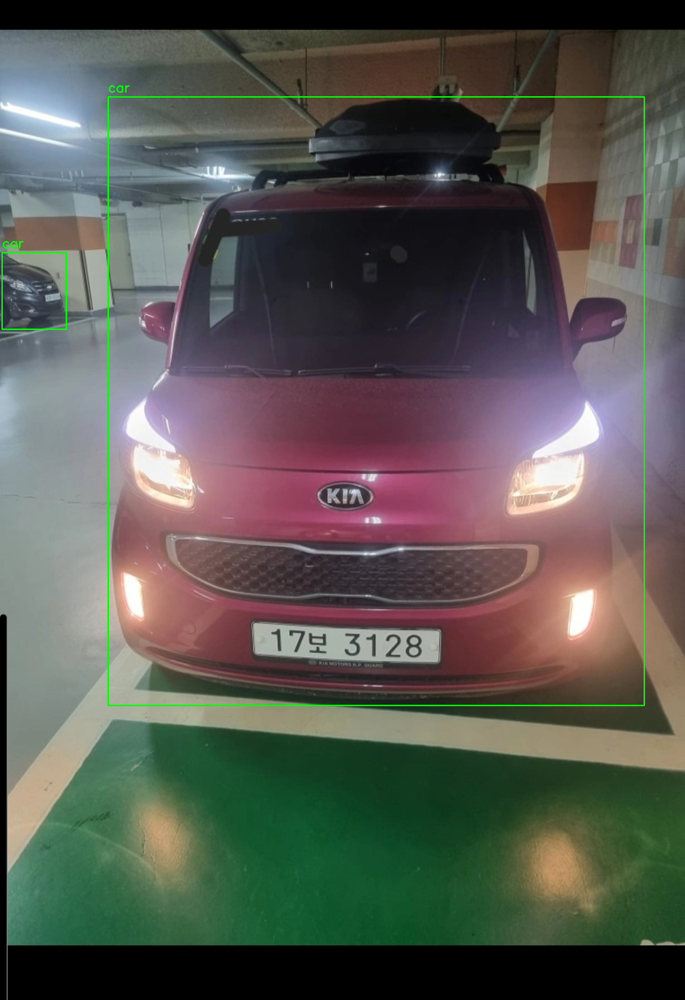

In [3]:

# YOLOv8 모델 불러오기 (pre-trained weight 사용)
model = YOLO('yolov8n.pt')  # yolov8n, yolov8s, yolov8m, yolov8l, yolov8x 등 사용 가능

# 이미지 불러오기
image_path = '자동차사진1.jpg'
img = cv2.imread(image_path)

# 모델을 사용하여 객체 검출
results = model(img)


# 차량 수 카운트
vehicle_count = 0

# 검출된 객체들 중 차량과 차선을 필터링
for result in results:
    boxes = result.boxes.xyxy.cpu().numpy()  # x1, y1, x2, y2
    labels = result.names  # 객체 레이블
    class_ids = result.boxes.cls.cpu().numpy()  # 각 박스의 클래스 ID
    confidences = result.boxes.conf.cpu().numpy()  # 신뢰도

    for box, class_id, confidence in zip(boxes, class_ids, confidences):
        label = labels[int(class_id)]
        if label in ['car', 'truck', 'bus']:  # 차량 검출
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (0, 255, 0), 2)
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (0, 255, 0), 2)

            # 차량 이미지 저장
            vehicle_count += 1
            vehicle_img = img[y1:y2, x1:x2]
            vehicle_image_path = f'vehicle_image_{vehicle_count}.jpg'
            cv2.imwrite(vehicle_image_path, vehicle_img)

        elif label in ['road line', 'solid line', 'dashed line']:  # 차선 검출
            x1, y1, x2, y2 = map(int, box)
            cv2.rectangle(img, (x1, y1), (x2, y2), (255, 0, 0), 2)
            cv2.putText(img, label, (x1, y1 - 10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, (255, 0, 0), 2)

# 검출 결과 확인
cv2_imshow(img)
cv2.waitKey(0)
cv2.destroyAllWindows()


## 3. 추출(저장)한 자동차 데이터에서 Tesseract OCR.ipynb 파일 실행

### 3.1. 자동차 이미지 불러오기 및 전처리

In [ ]:
for vehicle_number in range(1,vehicle_count+1):
  image_path = f'vehicle_image_{vehicle_number}.jpg'
  if image_path is None:
    print("이미지를 불러올 수 없습니다. 경로를 확인하세요.")
    break
  img = cv2.imread(image_path)
  height, width, channel = img.shape

  # 흑백화 (RGB -> GRAY)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Gaussian Blur + Thresholding
  img_blurred = cv2.GaussianBlur(gray, ksize=(5, 5), sigmaX=0)
  img_blur_thresh = cv2.adaptiveThreshold(
      img_blurred,
      maxValue=255.0,
      adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
      thresholdType=cv2.THRESH_BINARY_INV,
      blockSize=9,
      C=9
  )

  # Contours(경계선) 찾기
  contours, _ = cv2.findContours(
      img_blur_thresh,
      mode=cv2.RETR_LIST,
      method=cv2.CHAIN_APPROX_SIMPLE
  )

### 3.2. 윤곽선 검출 및 후보 영역 필터링

<ipython-input-4-5edf068466d6>:72: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  plt.figure(figsize=(12, 10))


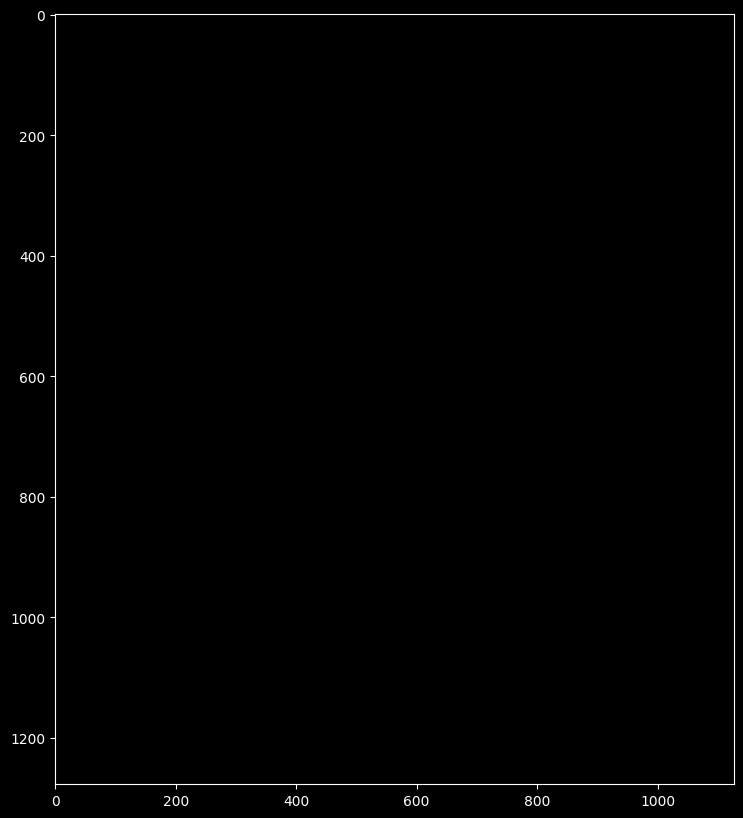

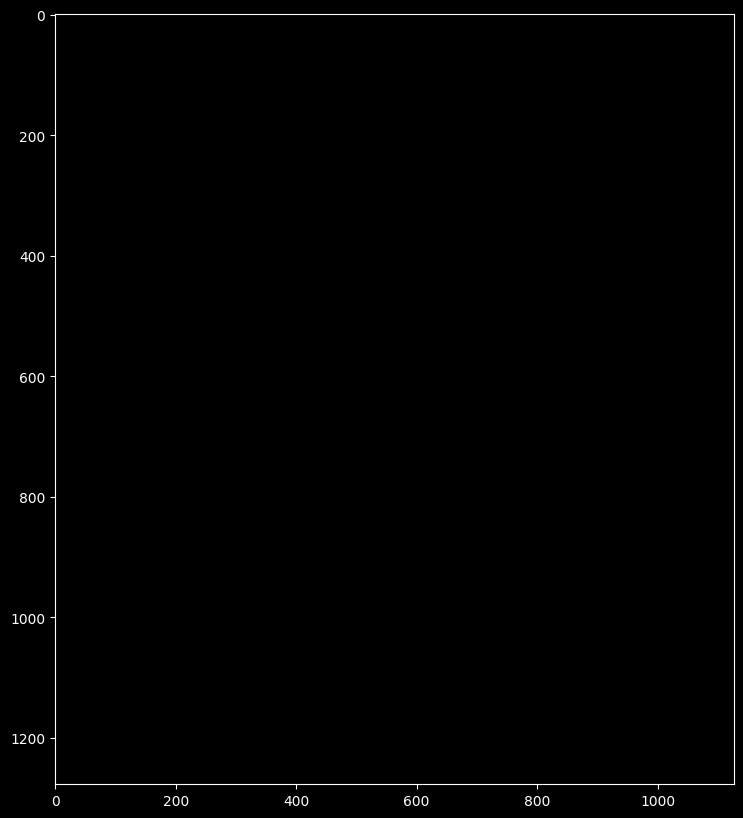

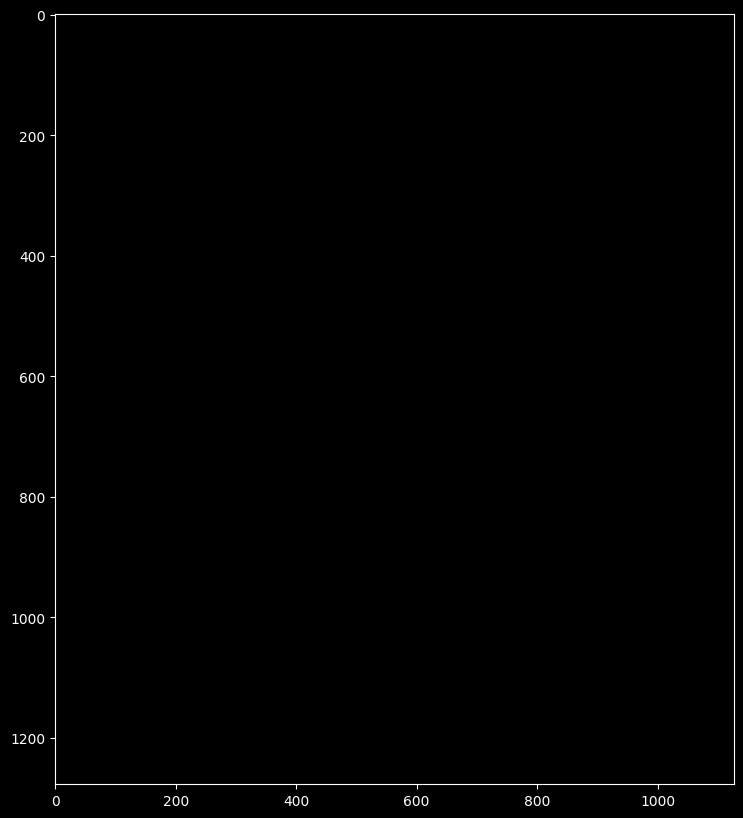

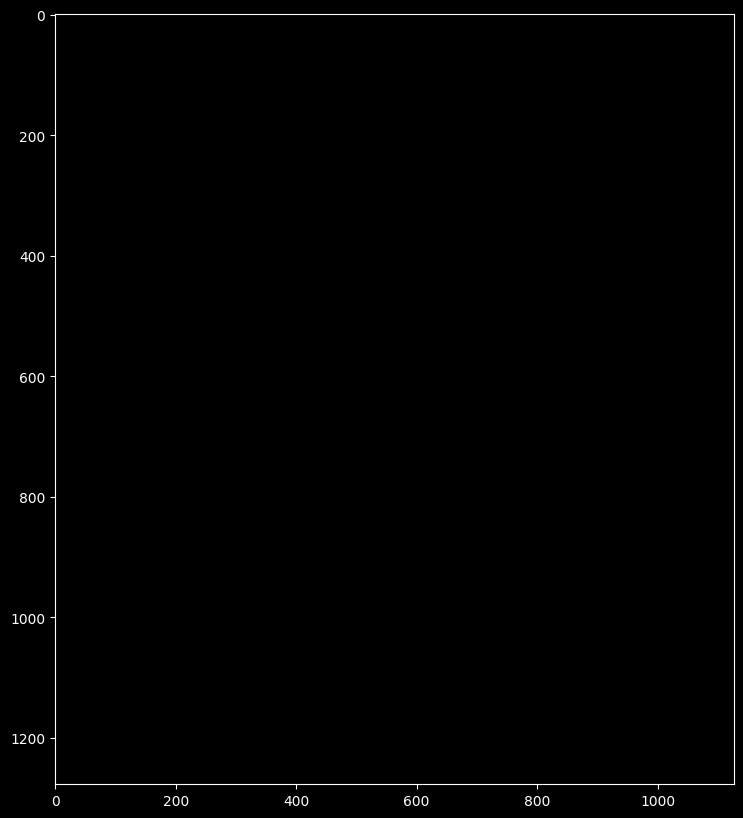

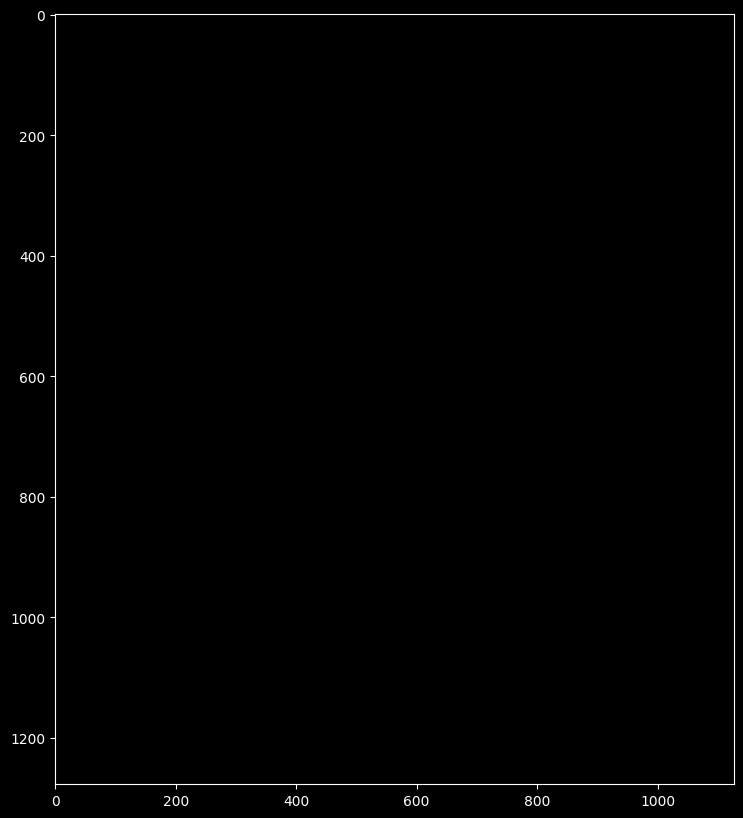

...

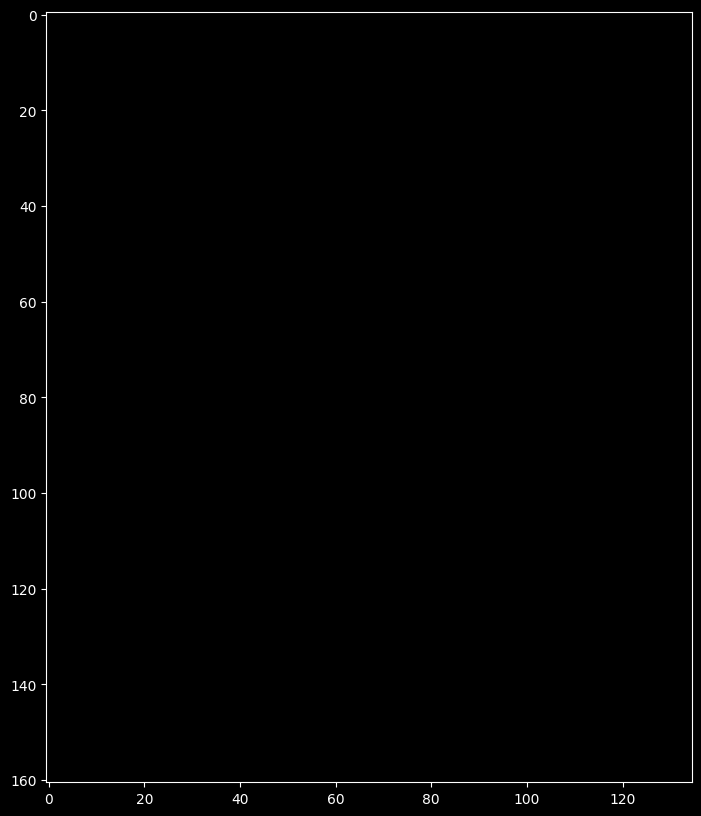

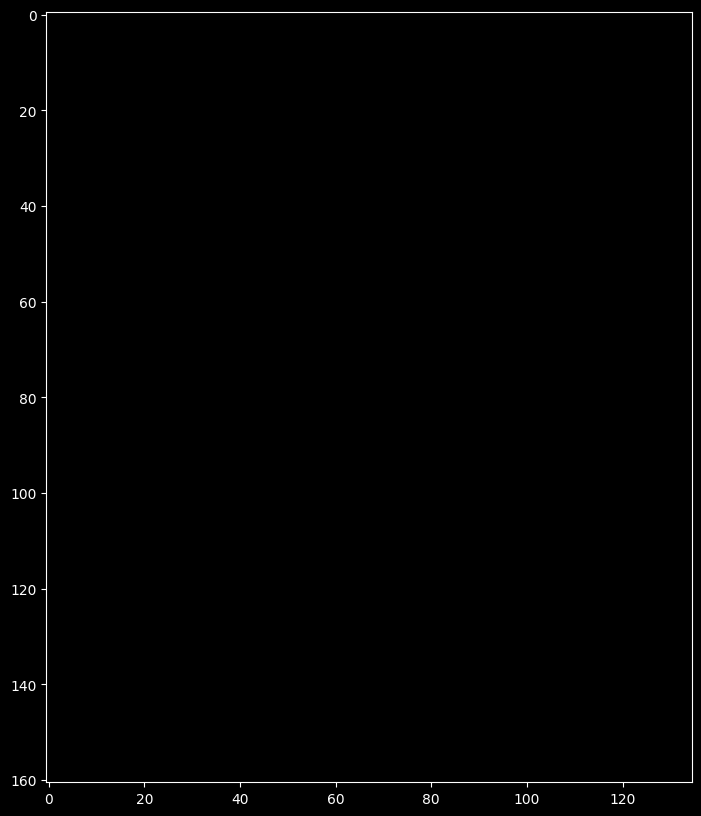

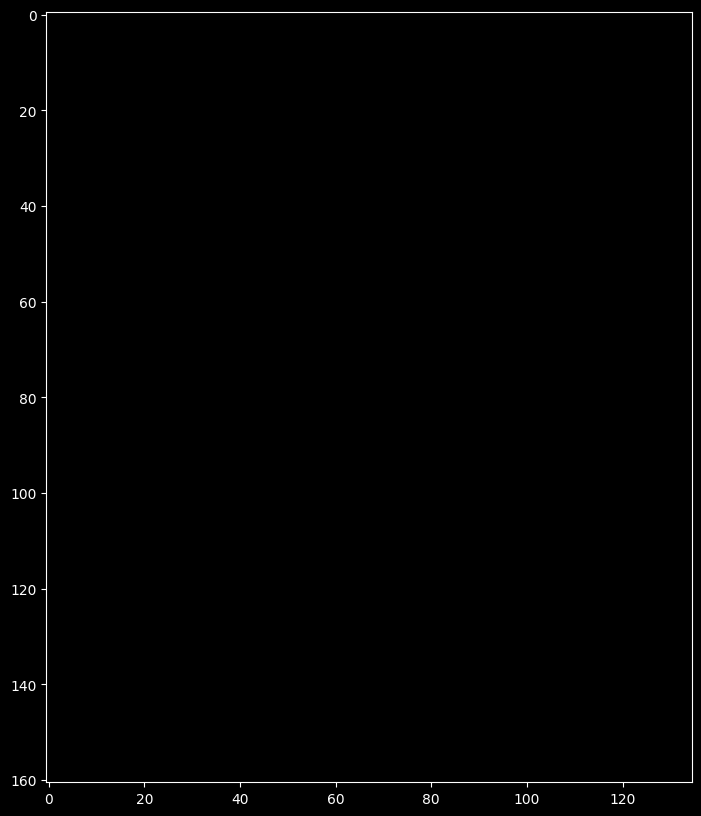

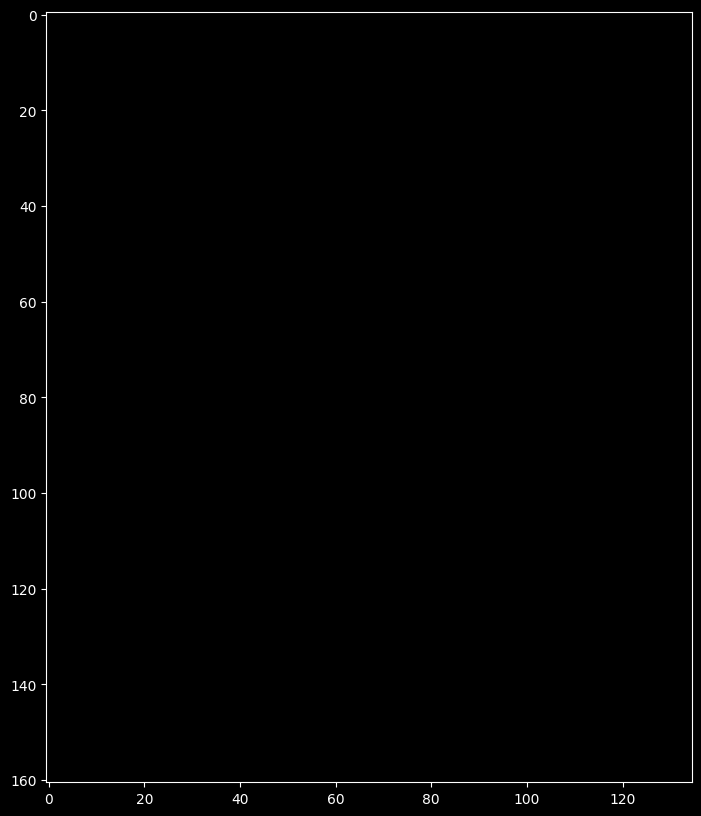

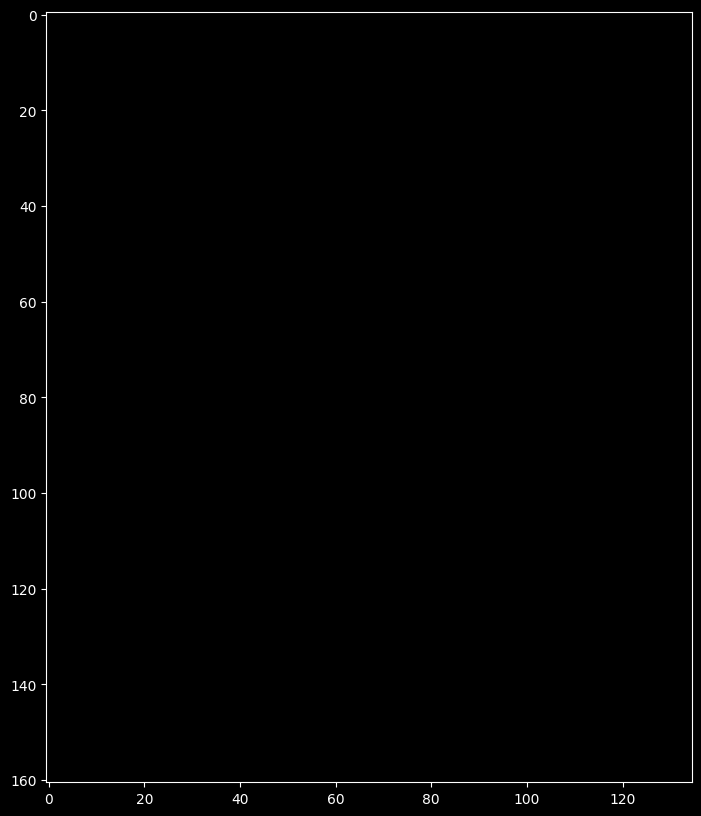

In [4]:
for vehicle_number in range(1,vehicle_count+1):
  image_path = f'vehicle_image_{vehicle_number}.jpg'
  if image_path is None:
    print("이미지를 불러올 수 없습니다. 경로를 확인하세요.")
    break
  img = cv2.imread(image_path)
  height, width, channel = img.shape

  # 흑백화 (RGB -> GRAY)
  gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

  # Gaussian Blur + Thresholding
  img_blurred = cv2.GaussianBlur(gray, ksize=(5, 5), sigmaX=0)
  img_blur_thresh = cv2.adaptiveThreshold(
      img_blurred,
      maxValue=255.0,
      adaptiveMethod=cv2.ADAPTIVE_THRESH_GAUSSIAN_C,
      thresholdType=cv2.THRESH_BINARY_INV,
      blockSize=9,
      C=9
  )

  # Contours(경계선) 찾기
  contours, _ = cv2.findContours(
      img_blur_thresh,
      mode=cv2.RETR_LIST,
      method=cv2.CHAIN_APPROX_SIMPLE
  )

  temp_result = np.zeros((height, width, channel), dtype=np.uint8)

  contours_dict = []

  for contour in contours:
    x, y, w, h = cv2.boundingRect(contour)
    cv2.rectangle(temp_result, pt1=(x,y), pt2=(x+w, y+h), color=(255,255,255), thickness=2)

    contours_dict.append({
        'contour': contour,
        'x': x,
        'y': y,
        'w': w,
        'h': h,
        'cx': x + (w / 2),
        'cy': y + (h / 2)
    })

    # 먼저 가능성이 있는 countour 찾기 (후에 추가)
    MIN_AREA = 80
    MIN_WIDTH, MIN_HEIGHT=2, 8
    MIN_RATIO, MAX_RATIO = 0.25, 1.0

    possible_contours = []

    cnt = 0
    for d in contours_dict:
        area = d['w'] * d['h']
        ratio = d['w'] / d['h']

        if area > MIN_AREA \
        and d['w'] > MIN_WIDTH and d['h'] > MIN_HEIGHT \
        and MIN_RATIO < ratio < MAX_RATIO:
            d['idx'] = cnt
            cnt += 1
            possible_contours.append(d)

    temp_result = np.zeros((height, width, channel), dtype = np.uint8)

    for d in possible_contours:
        cv2.rectangle(temp_result, pt1=(d['x'], d['y']), pt2=(d['x']+d['w'], d['y']+d['h']), color=(255, 255, 255), thickness=2)

    plt.figure(figsize=(12, 10))
    plt.imshow(temp_result, cmap='gray')

    # 그 중 번호판으로 추측되는 contour만 찾기

    MAX_DIAG_MULTIPLYER = 5
    MAX_ANGLE_DIFF = 12.0
    MAX_AREA_DIFF = 0.5
    MAX_WIDTH_DIFF = 0.8
    MAX_HEIGHT_DIFF = 0.2
    MIN_N_MATCHED = 3

    def find_chars(contour_list):
        matched_result_idx = []

        for d1 in contour_list:
            matched_contours_idx = []
            for d2 in contour_list:
                if d1['idx'] == d2['idx']:
                    continue

                dx = abs(d1['cx'] - d2['cx'])
                dy = abs(d1['cy'] - d2['cy'])

                diagonal_length1 = np.sqrt(d1['w'] ** 2 + d1['h'] ** 2)

                distance = np.linalg.norm(np.array([d1['cx'], d1['cy']]) - np.array([d2['cx'], d2['cy']]))
                if dx == 0:
                    angle_diff = 90
                else:
                    angle_diff = np.degrees(np.arctan(dy / dx))
                area_diff = abs(d1['w'] * d1['h'] - d2['w'] * d2['h']) / (d1['w'] * d1['h'])
                width_diff = abs(d1['w'] - d2['w']) / d1['w']
                height_diff = abs(d1['h'] - d2['h']) / d1['h']

                if distance < diagonal_length1 * MAX_DIAG_MULTIPLYER \
                and angle_diff < MAX_ANGLE_DIFF and area_diff < MAX_AREA_DIFF \
                and width_diff < MAX_WIDTH_DIFF and height_diff < MAX_HEIGHT_DIFF:
                    matched_contours_idx.append(d2['idx'])

            matched_contours_idx.append(d1['idx'])

            if len(matched_contours_idx) < MIN_N_MATCHED:
                continue

            # unmatched_contour에 대한 재귀 호출을 제거하여, 무한 루프를 방지합니다.
            # matched_result_idx.append(matched_contours_idx)

            # unmatched_contour_idx = []
            # for d4 in contour_list:
            #     if d4['idx'] not in matched_contours_idx:
            #         unmatched_contour_idx.append(d4['idx'])

            # unmatched_contour = np.take(possible_contours, unmatched_contour_idx)

            # recursive_contour_list = find_chars(unmatched_contour)

            # for idx in recursive_contour_list:
            #     matched_result_idx.append(idx)

            # break

        return matched_result_idx

    result_idx = find_chars(possible_contours)

    matched_result = []
    for idx_list in result_idx:
        matched_result.append(np.take(possible_contours, idx_list))

    temp_result = np.zeros((height, width, channel), dtype=np.uint8)

    for r in matched_result:
        for d in r:
            cv2.rectangle(temp_result, pt1=(d['x'], d['y']), pt2=(d['x']+d['w'], d['y']+d['h']), color=(255,255,255), thickness=2)

    # 이게 들어가야할까????

    PLATE_WIDTH_PADDING = 1.3 # 1.3
    PLATE_HEIGHT_PADDING = 1.5 # 1.5
    MIN_PLATE_RATIO = 3
    MAX_PLATE_RATIO = 10

    plate_imgs = []
    plate_infos = []

    for i, matched_chars in enumerate(matched_result):
        sorted_chars = sorted(matched_chars, key=lambda x: x['cx'])

        plate_cx = (sorted_chars[0]['cx'] + sorted_chars[-1]['cx']) / 2
        plate_cy = (sorted_chars[0]['cy'] + sorted_chars[-1]['cy']) / 2

        plate_width = (sorted_chars[-1]['x'] + sorted_chars[-1]['w'] - sorted_chars[0]['x']) * PLATE_WIDTH_PADDING

        sum_height = 0
        for d in sorted_chars:
            sum_height += d['h']

        plate_height = int(sum_height / len(sorted_chars) * PLATE_HEIGHT_PADDING)

        triangle_height = sorted_chars[-1]['cy'] - sorted_chars[0]['cy']
        triangle_hypotenus = np.linalg.norm(
            np.array([sorted_chars[0]['cx'], sorted_chars[0]['cy']]) -
            np.array([sorted_chars[-1]['cx'], sorted_chars[-1]['cy']])
        )

        angle = np.degrees(np.arcsin(triangle_height / triangle_hypotenus))

        rotation_matrix = cv2.getRotationMatrix2D(center=(plate_cx, plate_cy), angle=angle, scale=1.0)

        img_rotated = cv2.warpAffine(img_blur_thresh, M=rotation_matrix, dsize=(width, height))

        img_cropped = cv2.getRectSubPix(
            img_rotated,
            patchSize=(int(plate_width), int(plate_height)),
            center=(int(plate_cx), int(plate_cy))
        )

        if img_cropped.shape[1] / img_cropped.shape[0] < MIN_PLATE_RATIO or img_cropped.shape[1] / img_cropped.shape[0] < MIN_PLATE_RATIO > MAX_PLATE_RATIO:
            continue

        plate_imgs.append(img_cropped)
        plate_infos.append({
            'x': int(plate_cx - plate_width / 2),
            'y': int(plate_cy - plate_height / 2),
            'w': int(plate_width),
            'h': int(plate_height)
        })

        # 이게 들어가야할까????--------------------






    # 번호판 검출을 위해 다시 YOLO 모델을 사용 (번호판 전용 모델 사용 가능)

    longest_idx, longest_text = -1, 0
    plate_chars = []

    for i, plate_img in enumerate(plate_imgs):
        # 번호판 후보 영역 확대
        plate_img = cv2.resize(plate_img, dsize=(0, 0), fx=2, fy=2)
        _, plate_img = cv2.threshold(plate_img, thresh=0.0, maxval=255.0, type=cv2.THRESH_BINARY | cv2.THRESH_OTSU)

        # find contours again (same as above)
        contours, _ = cv2.findContours(plate_img, mode=cv2.RETR_LIST, method=cv2.CHAIN_APPROX_SIMPLE)

        plate_min_x, plate_min_y = plate_img.shape[1], plate_img.shape[0]
        plate_max_x, plate_max_y = 0, 0

        for contour in contours:
            x, y, w, h = cv2.boundingRect(contour)

            area = w * h
            ratio = w / h

            if area > MIN_AREA \
            and w > MIN_WIDTH and h > MIN_HEIGHT \
            and MIN_RATIO < ratio < MAX_RATIO:
                if x < plate_min_x:
                    plate_min_x = x
                if y < plate_min_y:
                    plate_min_y = y
                if x + w > plate_max_x:
                    plate_max_x = x + w
                if y + h > plate_max_y:
                    plate_max_y = y + h

        img_result = plate_img[plate_min_y:plate_max_y, plate_min_x:plate_max_x]

        img_result = cv2.GaussianBlur(img_result, ksize=(3, 3), sigmaX=0)
        _, img_result = cv2.threshold(img_result, thresh=0.0, maxval=255.0, type=cv2.THRESH_BINARY | cv2.THRESH_OTSU)
        img_result = cv2.copyMakeBorder(img_result, top=5, bottom=5, left=5, right=5, borderType=cv2.BORDER_CONSTANT, value=(0,0,0))



        chars = pytesseract.image_to_string(img_result, lang='kor', config='--psm 6 --oem 3 --dpi 300')


        result_chars = ''
        has_digit = False
        for c in chars:
            if ord('가') <= ord(c) <= ord('힣') or c.isdigit():
                if c.isdigit():
                    has_digit = True
                result_chars += c

        print(result_chars)
        plate_chars.append(result_chars)

        if has_digit and len(result_chars) > longest_text:
            longest_idx = i

        plt.subplot(len(plate_imgs), 1, i+1)
        plt.imshow(img_result, cmap='gray')

## 4. Tesseract를 사용한 차량 번호판 인식

In [ ]:
# Tesseract 경로 설정 (Windows 사용 시 필요)
# pytesseract.pytesseract.tesseract_cmd = r'C:\Program Files\Tesseract-OCR\tesseract.exe'
# 번호판 인식을 위해 차량 위치에서 이미지 크롭

# vehicle_count = 0 # 차량 수 카운트

for result in results:
    boxes = result.boxes.xyxy.cpu().numpy()
    class_ids = result.boxes.cls.cpu().numpy()

    for box, class_id in zip(boxes, class_ids):
        label = labels[int(class_id)]   # labels 자체는 Yolo에서 분류를 위한 라벨들의 리스트이기 때문이다.
        # print(box,class_id,label,"box와 class_id와 label")

        if label in ['car', 'truck', 'bus']:  # 차량 검출된 영역에서 번호판 인식 시도
            x1, y1, x2, y2 = map(int, box)
            vehicle_img = img[y1:y2, x1:x2]

            # # 차량 이미지 저장
            # vehicle_count += 1
            # vehicle_image_path = f'vehicle_image_{vehicle_count}.jpg'
            # cv2.imwrite(vehicle_image_path, vehicle_img)



            # 번호판 검출을 위해 다시 YOLO 모델을 사용 (번호판 전용 모델 사용 가능)

            plate_results = model(vehicle_img)

            for plate_result in plate_results:
                plate_boxes = plate_result.boxes.xyxy.cpu().numpy()
                plate_class_ids = plate_result.boxes.cls.cpu().numpy()

                for plate_box, plate_class_id in zip(plate_boxes, plate_class_ids):
                    plate_label = labels[int(plate_class_id)]
                    if plate_label == 'license plate':  # 번호판이 검출되면
                        px1, py1, px2, py2 = map(int, plate_box)
                        plate_img = vehicle_img[py1:py2, px1:px2]

                        # Tesseract OCR로 번호판 인식
                        chars = pytesseract.image_to_string(plate_img, config='--psm 6 --oem 3')  # psm 8은 단일 워드 인식에 최적화

                        result_chars = ''
                        has_digit = False
                        for c in chars:
                            if ord('가') <= ord(c) <= ord('힣') or c.isdigit():
                                if c.isdigit():
                                    has_digit = True
                                result_chars += c
                        print(result_chars)
                        plt.imshow(plate_img, cmap='gray')



            # # Tesseract OCR로 번호판 인식
            # chars = pytesseract.image_to_string(vehicle_img, lang='kor', config='--psm 6 --oem 3')
            # print(chars)
            # result_chars = ''
            # has_digit = False
            # for c in chars:
            #     if ord('가') <= ord(c) <= ord('힣') or c.isdigit():
            #         if c.isdigit():
            #             has_digit = True
            #         result_chars += c
            # print(result_chars)
            # plt.imshow(vehicle_img, cmap='gray')





0: 640x576 1 car, 282.0ms
Speed: 5.5ms preprocess, 282.0ms inference, 1.1ms postprocess per image at shape (1, 3, 640, 576)
2.0 iddddd

0: 640x544 (no detections), 186.4ms
Speed: 3.5ms preprocess, 186.4ms inference, 0.9ms postprocess per image at shape (1, 3, 640, 544)
